# **BikeShare Case**

At this time, I'll work with the BikeShare case with Python, one of the principal tools that this is made to be doing.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

### **Reviewing data**

The First step is to extract the datasets for this project this exercise is composed of 3 tables.

In [ ]:
# Review data of the stations
stations = pd.read_csv("station_data.csv")
print(stations)

    Id                               Name        Lat        Long  Dock Count  \
0    2  San Jose Diridon Caltrain Station  37.329732 -121.901782          27   
1    3              San Jose Civic Center  37.330698 -121.888979          15   
2    4             Santa Clara at Almaden  37.333988 -121.894902          11   
3    5                   Adobe on Almaden  37.331415 -121.893200          19   
4    6                   San Pedro Square  37.336721 -121.894074          15   
..  ..                                ...        ...         ...         ...   
71  77                  Market at Sansome  37.789625 -122.400811          27   
72  80    Santa Clara County Civic Center  37.352601 -121.905733          15   
73  82          Broadway St at Battery St  37.798541 -122.400862          15   
74  83                         Mezes Park  37.491269 -122.236234          15   
75  84                        Ryland Park  37.342725 -121.895617          15   

             City  
0        San Jose  

In [3]:
#Review the information of the stations table
stations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76 entries, 0 to 75
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Id          76 non-null     int64  
 1   Name        76 non-null     object 
 2   Lat         76 non-null     float64
 3   Long        76 non-null     float64
 4   Dock Count  76 non-null     int64  
 5   City        76 non-null     object 
dtypes: float64(2), int64(2), object(2)
memory usage: 3.7+ KB


In [6]:
# Review data of the trips
trips = pd.read_csv("trip_data.csv")
trips.head()

,Trip ID,Start Date,Start Station,End Date,End Station,Subscriber Type
0,913460,31/08/2015 23:26,50,31/08/2015 23:39,70,Subscriber
1,913459,31/08/2015 23:11,31,31/08/2015 23:28,27,Subscriber
2,913455,31/08/2015 23:13,47,31/08/2015 23:18,64,Subscriber
3,913454,31/08/2015 23:10,10,31/08/2015 23:17,8,Subscriber
4,913453,31/08/2015 23:09,51,31/08/2015 23:22,60,Customer


In [7]:
#Review the information of trips table
trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354152 entries, 0 to 354151
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Trip ID          354152 non-null  int64 
 1   Start Date       354152 non-null  object
 2   Start Station    354152 non-null  int64 
 3   End Date         354152 non-null  object
 4   End Station      354152 non-null  int64 
 5   Subscriber Type  354152 non-null  object
dtypes: int64(3), object(3)
memory usage: 16.2+ MB


In [8]:
# Review data of the weather
weather = pd.read_csv("weather_data.csv")
weather.head()

,Date,Max TemperatureF,Mean TemperatureF,Min TemperatureF,Max Dew PointF,MeanDew PointF,Min DewpointF,Max Humidity,Mean Humidity,Min Humidity,...,Mean VisibilityMiles,Min VisibilityMiles,Max Wind SpeedMPH,Mean Wind SpeedMPH,Max Gust SpeedMPH,PrecipitationIn,CloudCover,Events,WindDirDegrees,Zip
0,01/09/2014,83.0,70.0,57.0,58.0,56.0,52.0,86.0,64.0,42.0,...,10.0,8.0,16.0,7.0,20.0,0.0,0.0,NaN,290.0,94107
1,02/09/2014,72.0,66.0,60.0,58.0,57.0,55.0,84.0,73.0,61.0,...,10.0,7.0,21.0,8.0,NaN,0.0,5.0,NaN,290.0,94107
2,03/09/2014,76.0,69.0,61.0,57.0,56.0,55.0,84.0,69.0,53.0,...,10.0,10.0,21.0,8.0,24.0,0.0,4.0,NaN,276.0,94107
3,04/09/2014,74.0,68.0,61.0,57.0,57.0,56.0,84.0,71.0,57.0,...,10.0,8.0,22.0,8.0,25.0,0.0,5.0,NaN,301.0,94107
4,05/09/2014,72.0,66.0,60.0,57.0,56.0,54.0,84.0,71.0,57.0,...,9.0,7.0,18.0,8.0,32.0,0.0,4.0,NaN,309.0,94107


In [9]:
#Review the information of weather table
print(weather.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1825 entries, 0 to 1824
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       1825 non-null   object 
 1   Max TemperatureF           1821 non-null   float64
 2   Mean TemperatureF          1821 non-null   float64
 3   Min TemperatureF           1821 non-null   float64
 4   Max Dew PointF             1775 non-null   float64
 5   MeanDew PointF             1775 non-null   float64
 6   Min DewpointF              1775 non-null   float64
 7   Max Humidity               1775 non-null   float64
 8   Mean Humidity              1775 non-null   float64
 9   Min Humidity               1775 non-null   float64
 10  Max Sea Level PressureIn   1824 non-null   float64
 11  Mean Sea Level PressureIn  1824 non-null   float64
 12  Min Sea Level PressureIn   1824 non-null   float64
 13  Max VisibilityMiles        1820 non-null   float

On this occasion I'll work just with 2 of the 3 data frames

### **Transforming Data**

The case has an important Note:

**Note:**  During the period covered by the dataset, several stations were moved. Stations
23, 25, 49, 69, and 72 became respectively stations 85, 86, 87, 88, 89 (which in turn
became 90 after a second move).

So is important do these modifications before starting the treatment, not only on station_data (where is better drop these rows) but in trip_data too

In [10]:
#Replacing values in trip_data to normalize these stations

start_station_replacements = {
    85: 23,
    86: 25,
    87: 49,
    88: 69,
    89: 72,
    90: 72
}

end_station_replacements = {
    85: 23,
    86: 25,
    87: 49,
    88: 69,
    89: 72,
    90: 72
}

# Replace the values in the trips table and show a prompt to review the changes
for original, new in start_station_replacements.items():
    modify = (trips['Start Station'] == original).sum() #Count the total of registers replaced in the start station column
    trips['Start Station'].replace(original, new, inplace=True) #Replace values according to the instructions
    print(f'{modify} items were modified from {original} to {new} in Start Station.') #Review the total of replaced values

for original, new in end_station_replacements.items():
    modify = (trips['End Station'] == original).sum() #Count the total of registers replaced in the end station column
    trips['End Station'].replace(original, new, inplace=True) #Replace values according to the instructions
    print(f'{modify} itams were modified {original} from {new} in End Station.') #Review the total of replaced values

print(trips)  # Printing to review if the update is right


112 items were modified from 85 to 23 in Start Station.
418 items were modified from 86 to 25 in Start Station.
3372 items were modified from 87 to 49 in Start Station.
11740 items were modified from 88 to 69 in Start Station.
2749 items were modified from 89 to 72 in Start Station.
1848 items were modified from 90 to 72 in Start Station.
171 itams were modified 85 from 23 in End Station.
406 itams were modified 86 from 25 in End Station.
2700 itams were modified 87 from 49 in End Station.
12890 itams were modified 88 from 69 in End Station.
2647 itams were modified 89 from 72 in End Station.
1666 itams were modified 90 from 72 in End Station.
        Trip ID        Start Date  Start Station          End Date  \
0        913460  31/08/2015 23:26             50  31/08/2015 23:39   
1        913459  31/08/2015 23:11             31  31/08/2015 23:28   
2        913455  31/08/2015 23:13             47  31/08/2015 23:18   
3        913454  31/08/2015 23:10             10  31/08/2015 23:17  

After this update, the best way to see the information in trip_data is to show the actual name of each station, so using station_data I'll generate new columns according to equals id in each table

In [29]:
#The first step is mapping as a dictionary the respective couple data
id_stations = dict(zip(stations['Id'], stations['Name']))

# And will be necessary to add also city columns to the dictionary
id_cities = dict(zip(stations['Id'], stations['City']))


#Adding the new columns according to the registers
trips['Start Station Name'] = trips['Start Station'].map(id_stations)
trips['Start City'] = trips['Start Station'].map(id_cities)
trips['End Station Name'] = trips['End Station'].map(id_stations)
trips['End City'] = trips['End Station'].map(id_cities)

#Review the new table
trips.head()

,Trip ID,Start Date,Start Station,End Date,End Station,Subscriber Type,Start Station Name,End Station Name,Start Hour,End Hour,Start City,End City
0,913460,2015-08-31 23:26:00,50,2015-08-31 23:39:00,70,Subscriber,Harry Bridges Plaza (Ferry Building),San Francisco Caltrain (Townsend at 4th),23,23,San Francisco,San Francisco
1,913459,2015-08-31 23:11:00,31,2015-08-31 23:28:00,27,Subscriber,San Antonio Shopping Center,Mountain View City Hall,23,23,Mountain View,Mountain View
2,913455,2015-08-31 23:13:00,47,2015-08-31 23:18:00,64,Subscriber,Post at Kearney,2nd at South Park,23,23,San Francisco,San Francisco
3,913454,2015-08-31 23:10:00,10,2015-08-31 23:17:00,8,Subscriber,San Jose City Hall,San Salvador at 1st,23,23,San Jose,San Jose
4,913453,2015-08-31 23:09:00,51,2015-08-31 23:22:00,60,Customer,Embarcadero at Folsom,Embarcadero at Sansome,23,23,San Francisco,San Francisco


In [30]:
#Review data type of trips table after the modifications
print(trips.dtypes)

Trip ID                        int64
Start Date            datetime64[ns]
Start Station                  int64
End Date              datetime64[ns]
End Station                    int64
Subscriber Type               object
Start Station Name            object
End Station Name              object
Start Hour                     int32
End Hour                       int32
Start City                    object
End City                      object
dtype: object


In [31]:
#Viewing the trip_data dataframe the dates fields actually should be datetime type. So I'll convert these to that format
trips['Start Date'] = pd.to_datetime(trips['Start Date'], dayfirst=True) #Convert from object to datetime on the Start Date field
trips['End Date'] = pd.to_datetime(trips['End Date'], dayfirst=True) #Convert from object to datetime on the End Date field

print(trips.dtypes) #Review if the conversions are right
trips.head()

Trip ID                        int64
Start Date            datetime64[ns]
Start Station                  int64
End Date              datetime64[ns]
End Station                    int64
Subscriber Type               object
Start Station Name            object
End Station Name              object
Start Hour                     int32
End Hour                       int32
Start City                    object
End City                      object
dtype: object


,Trip ID,Start Date,Start Station,End Date,End Station,Subscriber Type,Start Station Name,End Station Name,Start Hour,End Hour,Start City,End City
0,913460,2015-08-31 23:26:00,50,2015-08-31 23:39:00,70,Subscriber,Harry Bridges Plaza (Ferry Building),San Francisco Caltrain (Townsend at 4th),23,23,San Francisco,San Francisco
1,913459,2015-08-31 23:11:00,31,2015-08-31 23:28:00,27,Subscriber,San Antonio Shopping Center,Mountain View City Hall,23,23,Mountain View,Mountain View
2,913455,2015-08-31 23:13:00,47,2015-08-31 23:18:00,64,Subscriber,Post at Kearney,2nd at South Park,23,23,San Francisco,San Francisco
3,913454,2015-08-31 23:10:00,10,2015-08-31 23:17:00,8,Subscriber,San Jose City Hall,San Salvador at 1st,23,23,San Jose,San Jose
4,913453,2015-08-31 23:09:00,51,2015-08-31 23:22:00,60,Customer,Embarcadero at Folsom,Embarcadero at Sansome,23,23,San Francisco,San Francisco


In [32]:
#Now the modification on stations_data
values_to_drop = [85, 86, 87, 88, 89, 90]
#Drop these rows
stations.drop(stations[stations['Id'].isin(values_to_drop)].index, inplace = True)
print(stations) #Printing to review if the update is right

    Id                               Name        Lat        Long  Dock Count  \
0    2  San Jose Diridon Caltrain Station  37.329732 -121.901782          27   
1    3              San Jose Civic Center  37.330698 -121.888979          15   
2    4             Santa Clara at Almaden  37.333988 -121.894902          11   
3    5                   Adobe on Almaden  37.331415 -121.893200          19   
4    6                   San Pedro Square  37.336721 -121.894074          15   
..  ..                                ...        ...         ...         ...   
71  77                  Market at Sansome  37.789625 -122.400811          27   
72  80    Santa Clara County Civic Center  37.352601 -121.905733          15   
73  82          Broadway St at Battery St  37.798541 -122.400862          15   
74  83                         Mezes Park  37.491269 -122.236234          15   
75  84                        Ryland Park  37.342725 -121.895617          15   

             City  
0        San Jose  

In [33]:
#Review data type of stations
print(stations.dtypes)

Id              int64
Name           object
Lat           float64
Long          float64
Dock Count      int64
City           object
dtype: object


### **Processing and Analysing Data**

In [16]:
#Before continuing with treatment and analysis, is necessary to create a function to count de total trips and group them by other column
def group(dt, grouped_column):
    grouped = dt.groupby(grouped_column)["Trip ID"].count().reset_index()
    grouped.rename(columns={"Trip ID": "Total Trips"}, inplace=True)
    return grouped

In [34]:
#Total started trips per station
start_trips_per_station = group(trips, 'Start Station Name') #Calculate the total started trips per started station
start_trips_per_station = start_trips_per_station.sort_values('Total Trips', ascending=False) #Sort results Descending by total trips
print('Started trips per station:')
print(start_trips_per_station)

Started trips per station:
                               Start Station Name  Total Trips
50       San Francisco Caltrain (Townsend at 4th)        26304
51        San Francisco Caltrain 2 (330 Townsend)        21758
24           Harry Bridges Plaza (Ferry Building)        17255
65  Temporary Transbay Terminal (Howard at Beale)        14436
18                         Embarcadero at Sansome        14158
..                                            ...          ...
32                                     Mezes Park          212
42                    Redwood City Medical Center          150
56                        San Mateo County Center          127
43                    Redwood City Public Library          118
21                              Franklin at Maple           81

[70 rows x 2 columns]


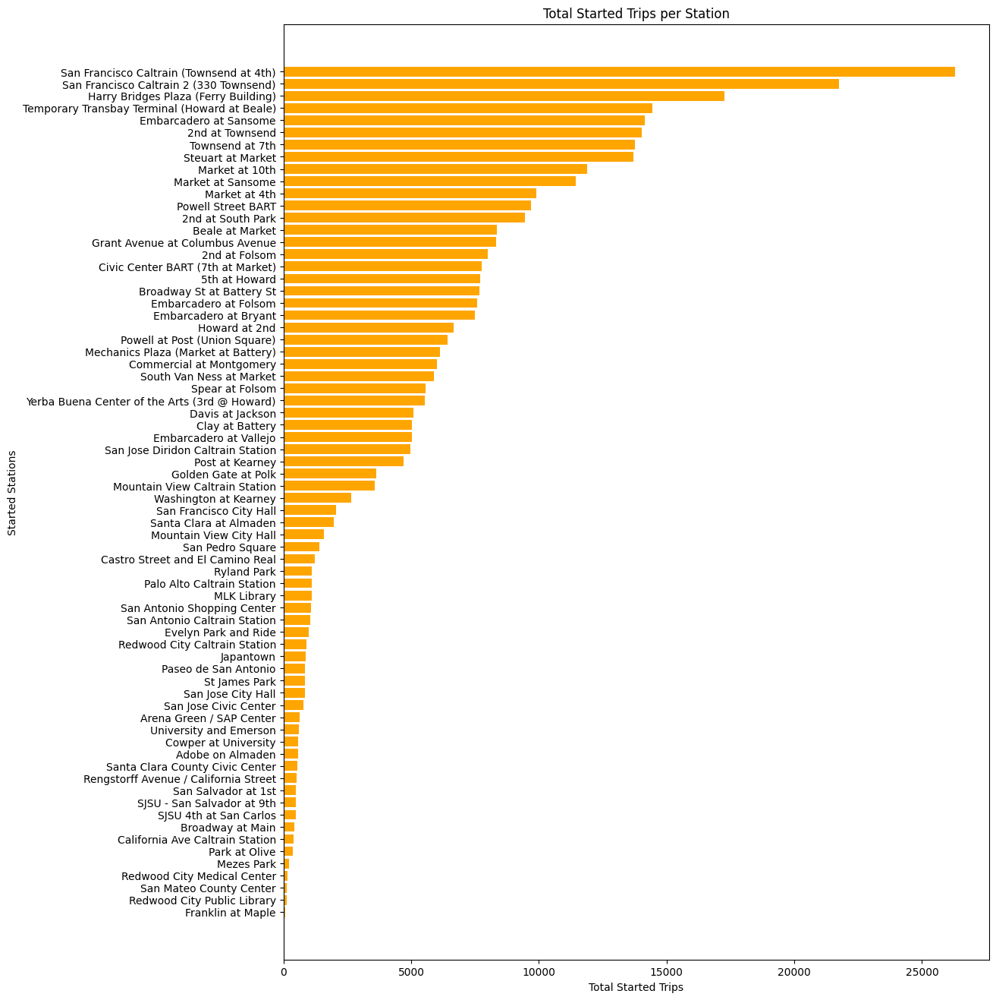

In [18]:
#Plotting the started trips per started station
plt.figure(figsize = (12, 16))
plt.barh(start_trips_per_station['Start Station Name'], start_trips_per_station['Total Trips'], color = 'orange')
plt.xlabel('Total Started Trips')
plt.ylabel('Started Stations')
plt.title('Total Started Trips per Station')
plt.gca().invert_yaxis()
plt.show()

In [19]:
#Total ended trips per station
end_trips_per_station = group(trips, 'End Station Name') #Calculate the total started trips per ended station
end_trips_per_station = end_trips_per_station.sort_values('Total Trips', ascending=False) #Sort results Descending by total trips
print('Ended trips per Station:')
print(end_trips_per_station)

Ended trips per Station:
                            End Station Name  Total Trips
50  San Francisco Caltrain (Townsend at 4th)        34810
51   San Francisco Caltrain 2 (330 Townsend)        22523
24      Harry Bridges Plaza (Ferry Building)        17810
2                            2nd at Townsend        15463
66                           Townsend at 7th        15422
..                                       ...          ...
42               Redwood City Medical Center          230
56                   San Mateo County Center          187
32                                Mezes Park          145
21                         Franklin at Maple          100
43               Redwood City Public Library           98

[70 rows x 2 columns]


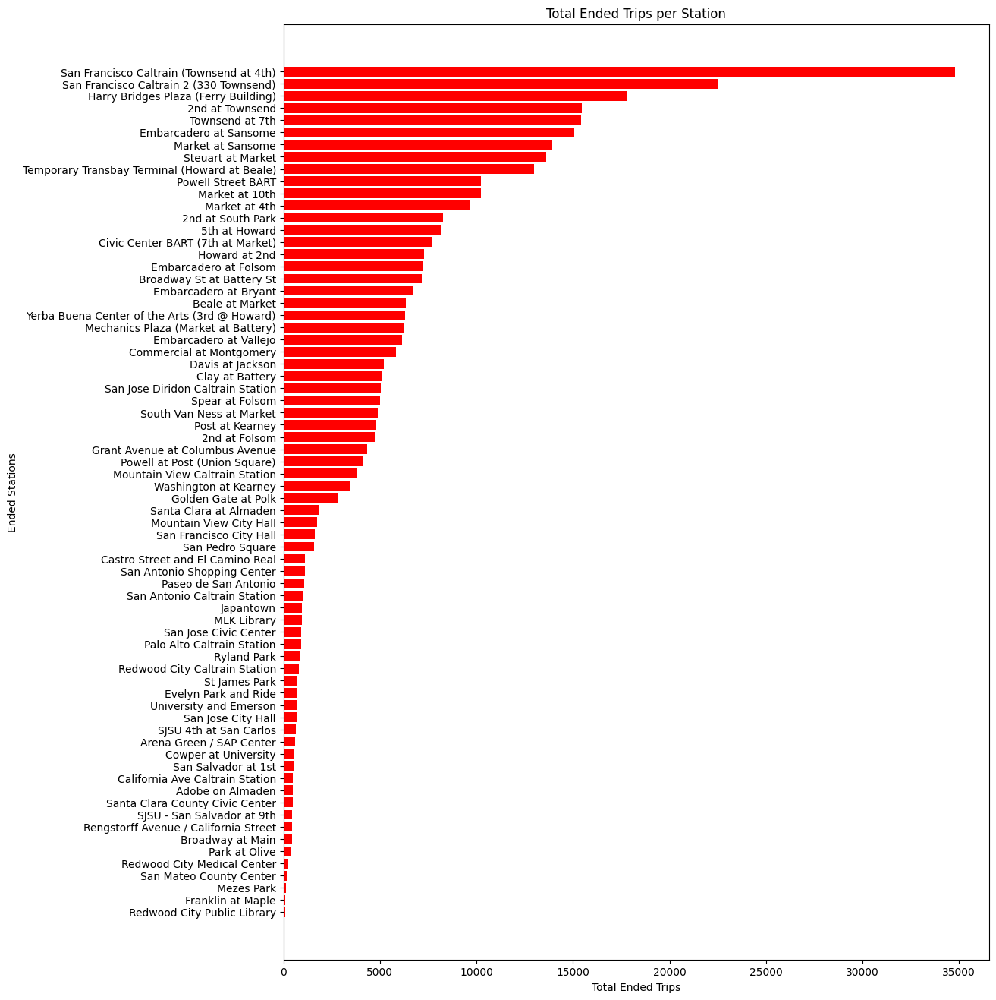

In [20]:
#Plotting the ended trips per ended station
plt.figure(figsize = (12, 16))
plt.barh(end_trips_per_station['End Station Name'], end_trips_per_station['Total Trips'], color = 'red')
plt.xlabel('Total Ended Trips')
plt.ylabel('Ended Stations')
plt.title('Total Ended Trips per Station')
plt.gca().invert_yaxis()
plt.show()

In [21]:
#Total started trips per start hour
trips['Start Hour'] =trips['Start Date'].dt.strftime('%H').astype(int) #Extract hour from the start date column
start_trips_per_hour = group(trips, 'Start Hour') #Calculate the total started trips per started hour
print('Started trips per hour:')
print(start_trips_per_hour)

Started trips per hour:
    Start Hour  Total Trips
0            0         1014
1            1          511
2            2          282
3            3          156
4            4          640
5            5         1848
6            6         8014
7            7        24743
8            8        49424
9            9        34944
10          10        15325
11          11        14064
12          12        15790
13          13        14702
14          14        12813
15          15        16490
16          16        31832
17          17        45818
18          18        30967
19          19        14914
20          20         8251
21          21         5741
22          22         3662
23          23         2207


In [ ]:
#Total ended trips per start hour
trips['End Hour'] =trips['End Date'].dt.strftime('%H').astype(int) #Extract hour from the end date column
ended_trips_per_hour = group(trips, 'End Hour') #Calculate the total started trips per ended hour
print('Ended trips per hour:')
print(ended_trips_per_hour)

Ended trips per hour:
    End Hour  Total Trips
0          0         1228
1          1          533
2          2          353
3          3          155
4          4          587
5          5         1592
6          6         6688
7          7        20735
8          8        45815
9          9        40170
10        10        16062
11        11        13018
12        12        15092
13        13        14748
14        14        12564
15        15        15095
16        16        28827
17        17        46721
18        18        35288
19        19        17026
20        20         9174
21        21         6177
22        22         4088
23        23         2416


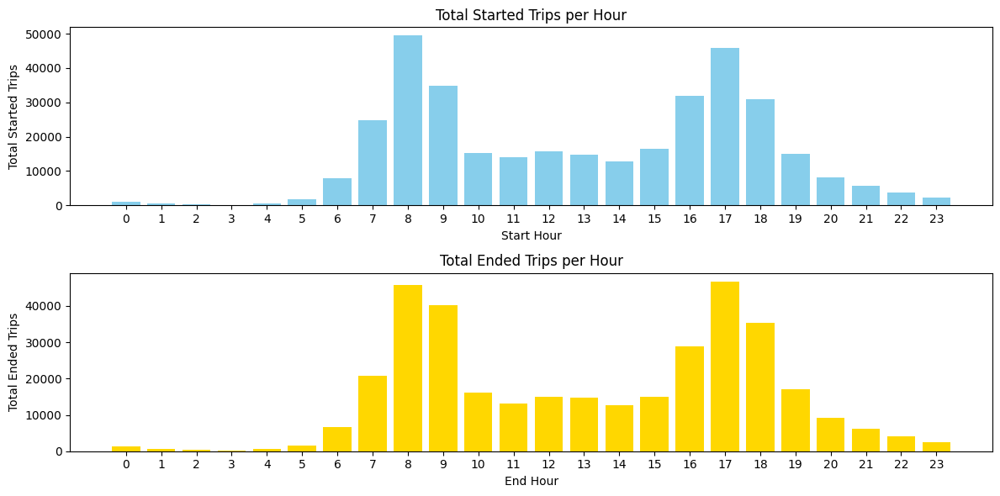

In [23]:
#The intention is plotting both in a same image

#Plotting the started trips per hour
plt.figure(figsize = (12, 6))

plt.subplot(2,1,1)
plt.bar(start_trips_per_hour['Start Hour'], start_trips_per_hour['Total Trips'], color = 'skyblue')
plt.xlabel('Start Hour')
plt.ylabel('Total Started Trips')
plt.title('Total Started Trips per Hour')
plt.xticks(start_trips_per_hour.index)


#Plotting the Ended trips per hour
plt.subplot(2,1,2)
plt.bar(ended_trips_per_hour['End Hour'], ended_trips_per_hour['Total Trips'], color = 'gold')
plt.xlabel('End Hour')
plt.ylabel('Total Ended Trips')
plt.title('Total Ended Trips per Hour')
plt.xticks(start_trips_per_hour.index)

plt.tight_layout()
plt.show()

Focusing on the day's hours is an interesting thing about the relations of the schedules between specific time ranges 8h-9h and 16h-18h, these have and pattern where more quantity of started and ended trips, with a variations. That maybe mean that the trips in BikeShare are more for employees. There are a lot of travels located on the start day and end day for specific situations.

In [35]:
#Now I'll group the started trips by Start Hour and Start Station
started_trips_per_station_and_hour = group(trips, ['Start Hour', 'Start Station Name']) #Calculate the total started trips per started hour and Station
print('Started trips per station and start hour')
print(started_trips_per_station_and_hour) 

Started trips per station and start hour
      Start Hour                             Start Station Name  Total Trips
0              0                                  2nd at Folsom           17
1              0                              2nd at South Park            8
2              0                                2nd at Townsend            9
3              0                                  5th at Howard           32
4              0                       Arena Green / SAP Center           29
...          ...                                            ...          ...
1524          23  Temporary Transbay Terminal (Howard at Beale)           16
1525          23                                Townsend at 7th           37
1526          23                         University and Emerson            7
1527          23                          Washington at Kearney           50
1528          23  Yerba Buena Center of the Arts (3rd @ Howard)           65

[1529 rows x 3 columns]


In [36]:
#Now group the ended trips by End Hour and End Station
ended_trips_per_station_and_hour = group(trips, ['End Hour', 'End Station Name']) #Calculate the total ended trips per ended hour and Station
print('Ended trips per station and end hour')
print(ended_trips_per_station_and_hour) 

Ended trips per station and end hour
      End Hour                               End Station Name  Total Trips
0            0                                  2nd at Folsom           15
1            0                              2nd at South Park           24
2            0                                2nd at Townsend           45
3            0                                  5th at Howard           59
4            0                               Adobe on Almaden            2
...        ...                                            ...          ...
1525        23  Temporary Transbay Terminal (Howard at Beale)           35
1526        23                                Townsend at 7th           58
1527        23                         University and Emerson            5
1528        23                          Washington at Kearney           75
1529        23  Yerba Buena Center of the Arts (3rd @ Howard)           20

[1530 rows x 3 columns]


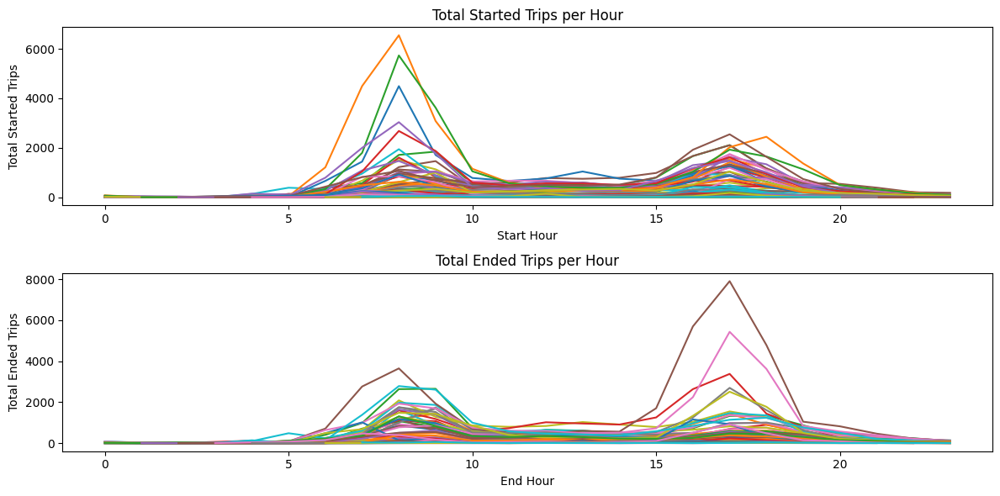

In [37]:
#The intention is plotting both situation in a same image

#Plotting the started trips per hour and Statio
plt.figure(figsize = (12, 6))

plt.subplot(2,1,1)

# Iterate over each station and create a separate plot for each one
for station in started_trips_per_station_and_hour['Start Station Name'].unique():
    station_data = started_trips_per_station_and_hour[started_trips_per_station_and_hour['Start Station Name'] == station]
    plt.plot(station_data['Start Hour'], station_data['Total Trips'], label=f'Station {station}')

#plt.bar(started_trips_per_station_and_hour['Start Hour'], started_trips_per_station_and_hour['Total Trips'], color = 'skyblue')
plt.xlabel('Start Hour')
plt.ylabel('Total Started Trips')
plt.title('Total Started Trips per Hour')



#Plotting the Ended trips per hour
plt.subplot(2,1,2)
# Iterate over each station and create a separate plot for each one
for station in ended_trips_per_station_and_hour['End Station Name'].unique():
    station_data = ended_trips_per_station_and_hour[ended_trips_per_station_and_hour['End Station Name'] == station]
    plt.plot(station_data['End Hour'], station_data['Total Trips'], label=f'Station {station}')

#plt.bar(ended_trips_per_station_and_hour['End Hour'], ended_trips_per_station_and_hour['Total Trips'], color = 'blue')
plt.xlabel('End Hour')
plt.ylabel('Total Ended Trips')
plt.title('Total Ended Trips per Hour')

#plt.legend(title='Station', loc ='right')
plt.tight_layout()
plt.show()

In [ ]:
# As extra point now I'll group the started trips by City, Start Hour and Start Station
started_trips_per_city_station_and_hour = group(trips, ['Start City','Start Hour', 'Start Station Name']) #Calculate the total started trips per started hour, city and Station
print('Started trips per city, station and start hour')
print(started_trips_per_city_station_and_hour) 

Started trips per city, station and start hour
         Start City  Start Hour                 Start Station Name  \
0     Mountain View           0     Mountain View Caltrain Station   
1     Mountain View           0            Mountain View City Hall   
2     Mountain View           0       San Antonio Caltrain Station   
3     Mountain View           0        San Antonio Shopping Center   
4     Mountain View           1   Castro Street and El Camino Real   
...             ...         ...                                ...   
1524       San Jose          23              San Jose Civic Center   
1525       San Jose          23  San Jose Diridon Caltrain Station   
1526       San Jose          23                   San Pedro Square   
1527       San Jose          23                San Salvador at 1st   
1528       San Jose          23             Santa Clara at Almaden   

      Total Trips  
0               2  
1               4  
2               2  
3               2  
4           

In [39]:
#Continue with the new intention, now group the ended trips by City End Hour and End Station
ended_trips_per_city_station_and_hour = group(trips, ['End City', 'End Hour', 'End Station Name']) #Calculate the total ended trips per ended hour, city and Station
print('Ended trips per city, station and end hour')
print(ended_trips_per_city_station_and_hour) 

Ended trips per city, station and end hour
           End City  End Hour                       End Station Name  \
0     Mountain View         0       Castro Street and El Camino Real   
1     Mountain View         0                   Evelyn Park and Ride   
2     Mountain View         0                Mountain View City Hall   
3     Mountain View         0  Rengstorff Avenue / California Street   
4     Mountain View         0           San Antonio Caltrain Station   
...             ...       ...                                    ...   
1525       San Jose        23      San Jose Diridon Caltrain Station   
1526       San Jose        23                       San Pedro Square   
1527       San Jose        23                    San Salvador at 1st   
1528       San Jose        23                 Santa Clara at Almaden   
1529       San Jose        23                          St James Park   

      Total Trips  
0               1  
1               2  
2               3  
3           

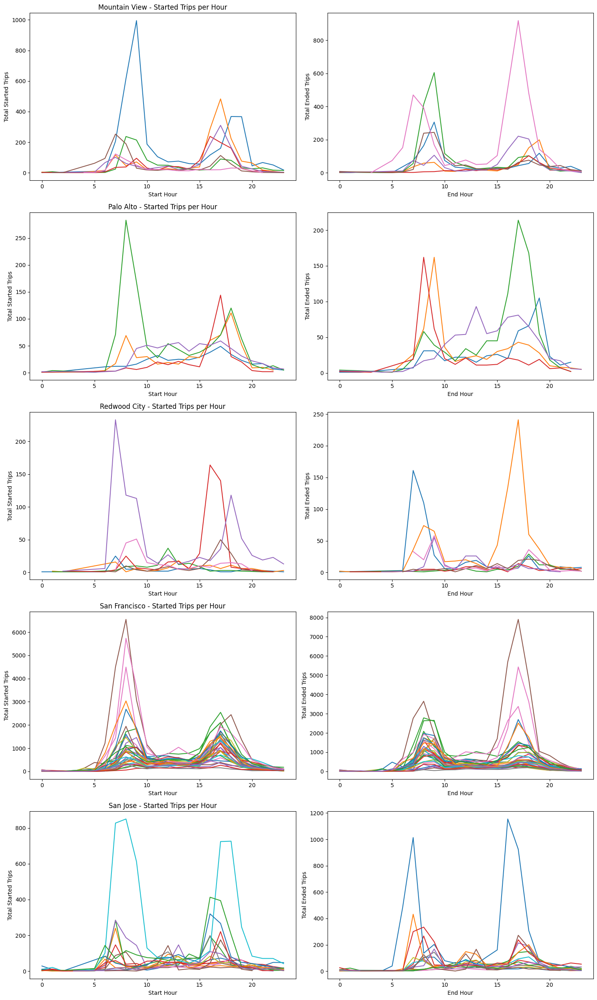

In [42]:
# Subgroups by city
cities = started_trips_per_city_station_and_hour['Start City'].unique()

# Setup subplots by city
fig, axes = plt.subplots(len(cities), 2, figsize=(15, 5 * len(cities)))

for i, city in enumerate(cities):
    # Filter data by city
    city_started_trips = started_trips_per_city_station_and_hour[started_trips_per_city_station_and_hour['Start City'] == city]
    city_ended_trips = ended_trips_per_city_station_and_hour[ended_trips_per_city_station_and_hour['End City'] == city]

    # Subplot started trips
    ax1 = axes[i, 0] if len(cities) > 1 else axes[0]  # Adjust index if there is only one city
    for station in city_started_trips['Start Station Name'].unique():
        station_data = city_started_trips[city_started_trips['Start Station Name'] == station]
        ax1.plot(station_data['Start Hour'], station_data['Total Trips'], label=f'Station {station}')
    
    ax1.set_title(f'{city} - Started Trips per Hour')
    ax1.set_xlabel('Start Hour')
    ax1.set_ylabel('Total Started Trips')

    # Subplot ended trips
    ax2 = axes[i, 1] if len(cities) > 1 else axes[1]  #Adjust index if there is only one city
    for station in city_ended_trips['End Station Name'].unique():
        station_data = city_ended_trips[city_ended_trips['End Station Name'] == station]
        ax2.plot(station_data['End Hour'], station_data['Total Trips'], label=f'Station {station}')
    
    ax2.set_xlabel('End Hour')
    ax2.set_ylabel('Total Ended Trips')

# Adjus design
plt.tight_layout()
plt.show()


When applying a segmentation per station of this concept, is easier to see the behavior per station, and similar to the previous visualization, there is a pattern, because where stations generate more started trips, the ended trips are low, meanwhile at the end of the day are more ended trips than started trips in each station. Generating a little conclusion of employee times and communication between residential zones and enterprise zones.

To calculate the **Net Rate** right now exists a part of the information for this, that's ***started_trips_per_station_and_hour*** and ***ended_trips_per_station_and_hour*** but, actually net rate is defined as trips ended minus trips started at the station for a given hour. So is necessary to apply a strategy to equal rows where Start Station = End Station and Start Hour = End Hour simultaneously

In [45]:
#So first, generate a new dataframe with these 2 variables
table_for_net_rate = started_trips_per_station_and_hour.merge(ended_trips_per_station_and_hour, how = 'inner',
                                                               left_on = ['Start Station Name', 'Start Hour'], 
                                                               right_on = ['End Station Name', 'End Hour'])
#Because now we merge the 2 table, basically I just want one field for station and hour so I'll drop these columns and rename others
table_for_net_rate.drop(columns=['End Station Name', 'End Hour'], inplace= True)
table_for_net_rate.rename(columns = {'Start Station Name': 'Station Name',
                                      'Start Hour': 'Hour',
                                      'Total Trips_x': 'Started Trips',
                                      'Total Trips_y': 'Ended Trips'}, inplace= True)
print(table_for_net_rate)

      Hour                                   Station Name  Started Trips  \
0        0                                  2nd at Folsom             17   
1        0                              2nd at South Park              8   
2        0                                2nd at Townsend              9   
3        0                                  5th at Howard             32   
4        0                       Arena Green / SAP Center             29   
...    ...                                            ...            ...   
1463    23  Temporary Transbay Terminal (Howard at Beale)             16   
1464    23                                Townsend at 7th             37   
1465    23                         University and Emerson              7   
1466    23                          Washington at Kearney             50   
1467    23  Yerba Buena Center of the Arts (3rd @ Howard)             65   

      Ended Trips  
0              15  
1              24  
2              45  
3      

In [46]:
table_for_net_rate['Net Rate'] = table_for_net_rate['Ended Trips'] - table_for_net_rate['Started Trips']
table_for_net_rate.head()

,Hour,Station Name,Started Trips,Ended Trips,Net Rate
0,0,2nd at Folsom,17,15,-2
1,0,2nd at South Park,8,24,16
2,0,2nd at Townsend,9,45,36
3,0,5th at Howard,32,59,27
4,0,Arena Green / SAP Center,29,1,-28


In [47]:
#Create a function to simplify next calculates and plot for this new metric
def net_rate_group(df, grouped_column):
    net_rate_total = df.groupby(grouped_column)["Net Rate"].sum().reset_index()
    return net_rate_total

In [48]:
#Calculate the Net Rate per hour
net_rate_per_hour = net_rate_group(table_for_net_rate, 'Hour')
print(net_rate_per_hour)

    Hour  Net Rate
0      0       205
1      1        37
2      2        57
3      3        -5
4      4       -56
5      5      -205
6      6     -1198
7      7     -3983
8      8     -3609
9      9      5231
10    10       733
11    11     -1050
12    12      -698
13    13        46
14    14      -249
15    15     -1395
16    16     -3005
17    17       903
18    18      4321
19    19      2112
20    20       921
21    21       425
22    22       386
23    23       177


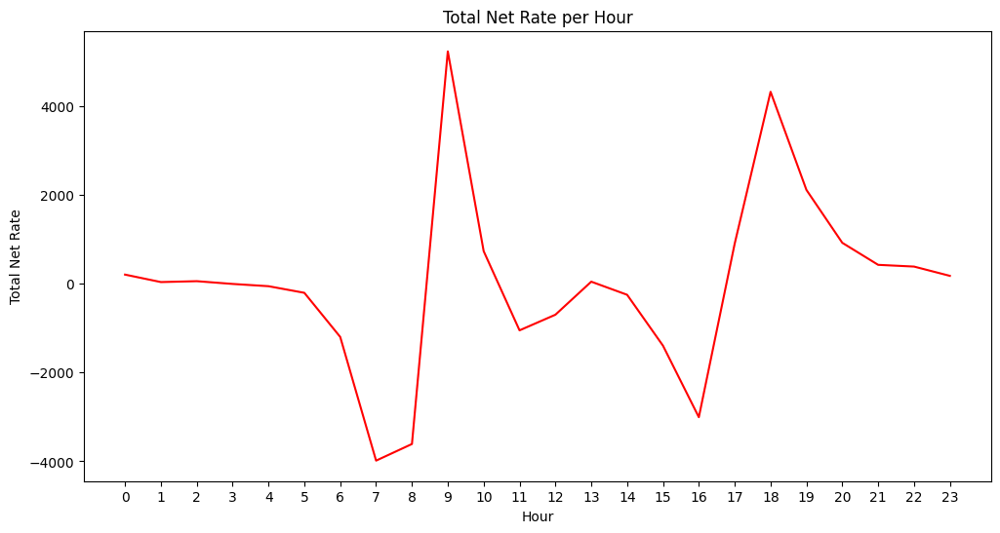

In [49]:
#Plotting the Net Rate per hours
plt.figure(figsize = (12, 6))
plt.plot(net_rate_per_hour['Hour'], net_rate_per_hour['Net Rate'], color = 'red')
plt.xlabel('Hour')
plt.ylabel('Total Net Rate')
plt.title('Total Net Rate per Hour')
plt.xticks(net_rate_per_hour.index)
plt.show()

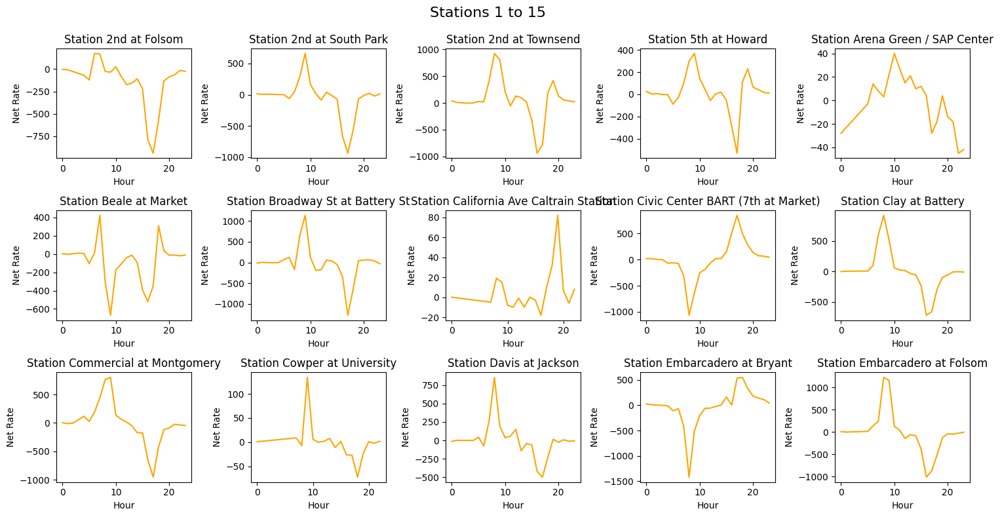

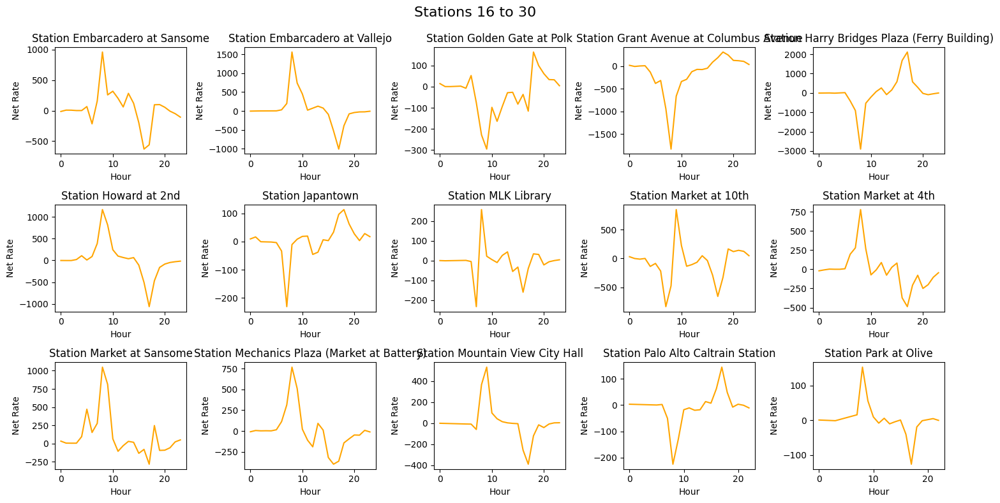

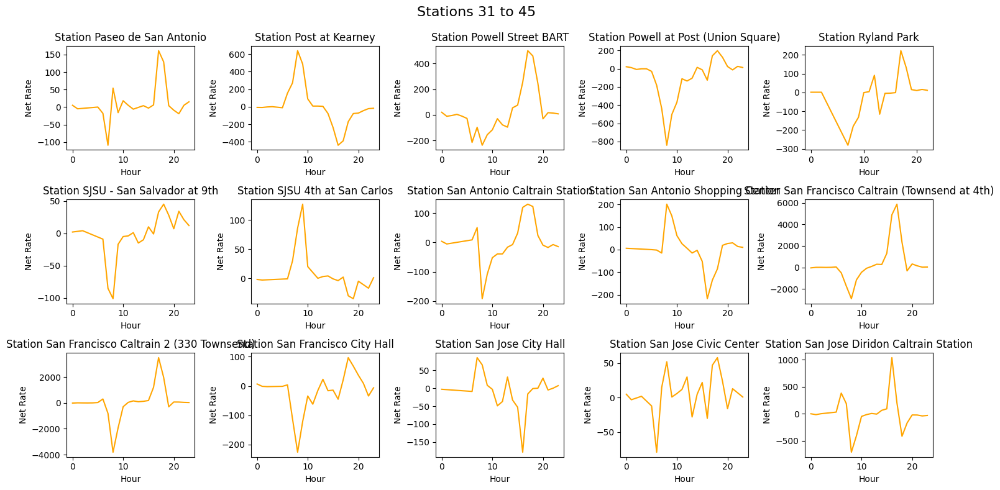

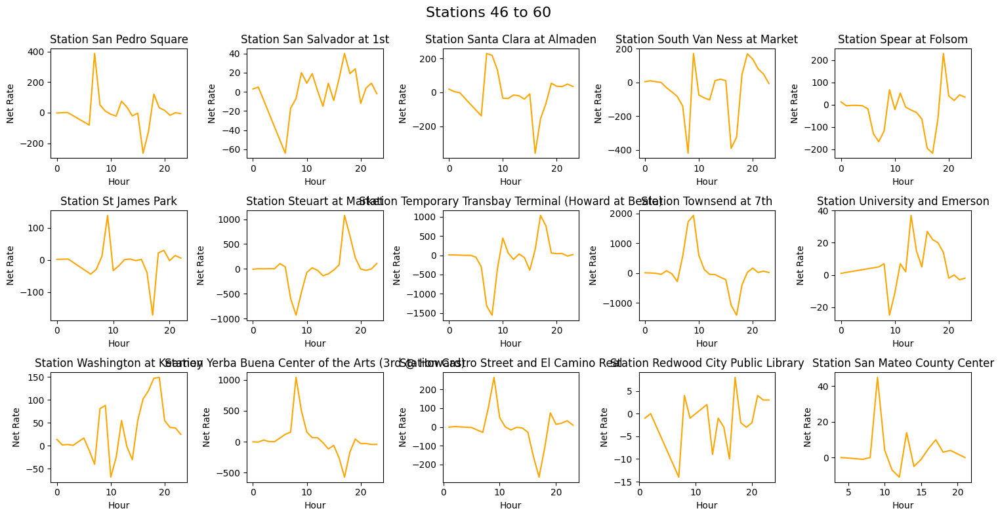

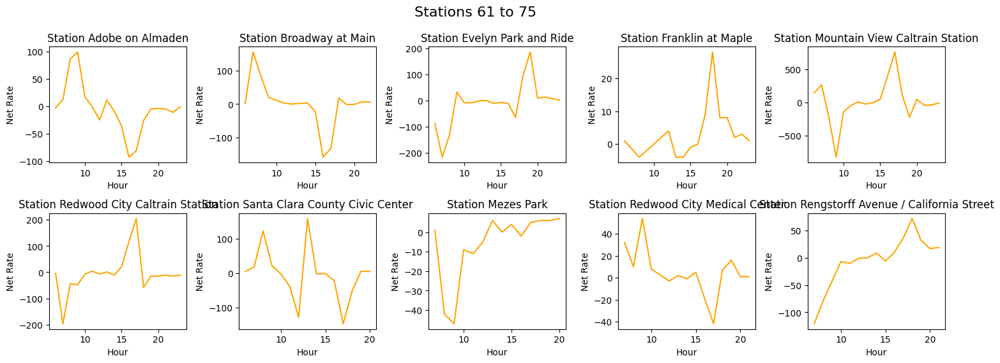

In [50]:
#Listing Stations Name
stations = table_for_net_rate['Station Name'].unique()

#Assing dimensions of subploting
num_rows = 3
num_cols = 5

# Calculate the total of subplots
num_subplots = num_rows * num_cols

#Generation groups od subplots
station_groups = [stations[i:i + num_subplots] for i in range(0, len(stations), num_subplots)]

#Plotting
for i, station_group in enumerate(station_groups):
    plt.figure(figsize=(15, 8))
    plt.suptitle(f'Stations {i * num_subplots + 1} to {(i + 1) * num_subplots}', fontsize=16)
    
    for j, station in enumerate(station_group):
        plt.subplot(num_rows, num_cols, j + 1)
        station_data = table_for_net_rate[table_for_net_rate['Station Name'] == station]
        plt.plot(station_data['Hour'], station_data['Net Rate'], label=f'Station {station}', color = 'orange')
        plt.xlabel('Hour')
        plt.ylabel('Net Rate')
        plt.title(f'Station {station}')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()


Other important information in this dataset, is can see the trip's behavior per day in the period range

#### Daily Summary View

First the calculation will be in a summary view

In [76]:
#Total started trips per start day
trips['Start Dated'] = trips['Start Date'].dt.date #As I want see the data per day and the hour is already extracted, so is good idea convert from
                                                    #datetime to just date
start_trips_per_day = group(trips, 'Start Dated') #Calculate the total started trips per started hour
print('Started trips per Day:')
print(start_trips_per_day)

Started trips per Day:
    Start Dated  Total Trips
0    2014-09-01          368
1    2014-09-02         1319
2    2014-09-03         1404
3    2014-09-04         1389
4    2014-09-05         1265
..          ...          ...
360  2015-08-27         1443
361  2015-08-28         1220
362  2015-08-29          342
363  2015-08-30          331
364  2015-08-31         1369

[365 rows x 2 columns]


In [ ]:
#Doing the same thing in Ended trips also
#Total ended trips per start day
trips['End Dated'] = trips['End Date'].dt.date #As I want see the data per day and the hour is already extracted, so is good idea convert from
                                                    #datetime to just date
ended_trips_per_day = group(trips, 'End Dated') #Calculate the total started trips per started hour
print('Ended trips per hour and Day:')
print(ended_trips_per_day)

Ended trips per hour and Day:
      End Dated  Total Trips
0    2014-09-01          365
1    2014-09-02         1317
2    2014-09-03         1409
3    2014-09-04         1387
4    2014-09-05         1262
..          ...          ...
360  2015-08-27         1442
361  2015-08-28         1220
362  2015-08-29          342
363  2015-08-30          331
364  2015-08-31         1370

[365 rows x 2 columns]


In [94]:
#Now is necessary generate the Net rate with these new variables
net_rate_per_day_summary = start_trips_per_day.merge(ended_trips_per_day, how = 'inner',
                                                                left_on= 'Start Dated',
                                                                right_on= 'End Dated')

#And rename the other columns
net_rate_per_day_summary.rename(columns= {'Start Dated': 'Date',
                                            'Total Trips_x': 'Started Trips',
                                            'Total Trips_y': 'Ended Trips'},
                                            inplace= True)

# Calculate the Net Rate per day
net_rate_per_day_summary['Net Rate'] = net_rate_per_day_summary['Ended Trips'] - net_rate_per_day_summary['Started Trips']

#Review Table  
net_rate_per_day_summary.head()

,Date,Started Trips,End Dated,Ended Trips,Net Rate
0,2014-09-01,368,2014-09-01,365,-3
1,2014-09-02,1319,2014-09-02,1317,-2
2,2014-09-03,1404,2014-09-03,1409,5
3,2014-09-04,1389,2014-09-04,1387,-2
4,2014-09-05,1265,2014-09-05,1262,-3


In [95]:
#Create a function to simplify calculation in this new table
def daily_net_rate(df, grouped_columns):
    net_rate_per_day = df.groupby(grouped_columns)["Net Rate"].sum().reset_index()
    return net_rate_per_day

In [96]:
#Calculate Net Rate per Day
net_rate_per_day_summary = daily_net_rate(net_rate_per_day_summary, 'Date')
print(net_rate_per_day_summary)

           Date  Net Rate
0    2014-09-01        -3
1    2014-09-02        -2
2    2014-09-03         5
3    2014-09-04        -2
4    2014-09-05        -3
..          ...       ...
360  2015-08-27        -1
361  2015-08-28         0
362  2015-08-29         0
363  2015-08-30         0
364  2015-08-31         1

[365 rows x 2 columns]


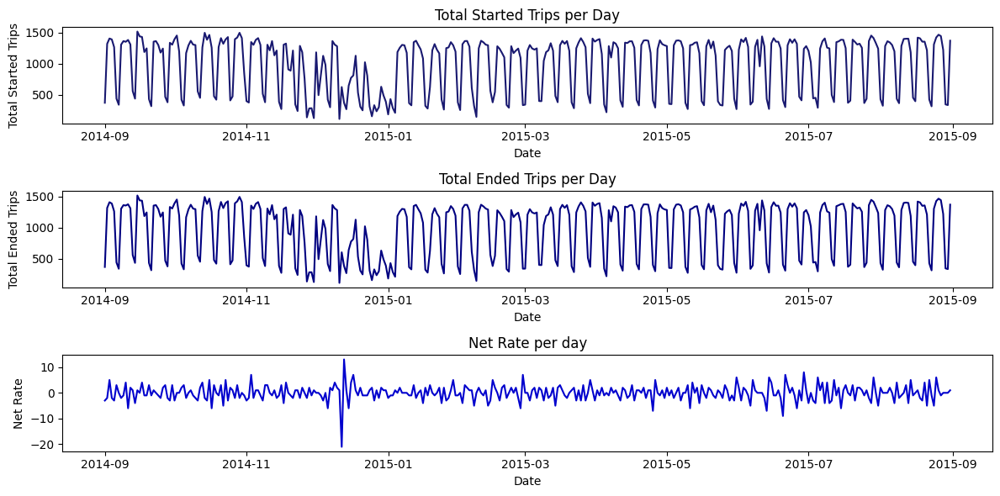

In [97]:
#Plotting started and ended trips per day

#Plotting started trips per day
plt.figure(figsize = (12, 6))

plt.subplot(3,1,1)
plt.plot(start_trips_per_day['Start Dated'], start_trips_per_day['Total Trips'], color = 'midnightblue')
plt.xlabel('Date')
plt.ylabel('Total Started Trips')
plt.title('Total Started Trips per Day')



#Plotting the Ended trips per day
plt.subplot(3,1,2)
plt.plot(ended_trips_per_day['End Dated'], ended_trips_per_day['Total Trips'], color = 'navy')
plt.xlabel('Date')
plt.ylabel('Total Ended Trips')
plt.title('Total Ended Trips per Day')

#Plotting the Net Rate per day
plt.subplot(3,1,3)
plt.plot(net_rate_per_day_summary['Date'], net_rate_per_day_summary['Net Rate'], color = 'mediumblue')
plt.xlabel('Date')
plt.ylabel('Net Rate')
plt.title('Net Rate per day')

plt.tight_layout()
plt.show()

#### Detailed Daily view

And for a better view, why not review the behavior by station. So now the way will be in over that perspective

In [107]:
#For better view on some things in the time view, we need to group stations, day and hour, generating 2 new varibles, because
#is needed for Net Rate
#Total started trips per station by start hour and day
trips['Start Hour'] =trips['Start Date'].dt.strftime('%H').astype(int) #Extract hour from the start date column
trips['Start Dated'] = trips['Start Date'].dt.date #As I want see the data per day and the hour is already extracted, so is good idea convert from
                                                    #datetime to just date
start_trips_per_hour_and_day = group(trips, ['Start Dated','Start Hour', 'Start Station Name']) #Calculate the total started trips per started hour
print('Started trips per station by hour and Day:')
print(start_trips_per_hour_and_day)

#Doing the same thind in Ended trip by hour and day
trips['End Hour'] =trips['End Date'].dt.strftime('%H').astype(int) #Extract hour from the start date column
trips['End Dated'] = trips['End Date'].dt.date #As I want see the data per day and the hour is already extracted, so is good idea convert from
                                                    #datetime to just date
ended_trips_per_hour_and_day = group(trips, ['End Dated','End Hour', 'End Station Name']) #Calculate the total started trips per started hour
print('Endeded trips per station by hour and Day:')
print(ended_trips_per_hour_and_day)

Started trips per station by hour and Day:
       Start Dated  Start Hour                             Start Station Name  \
0       2014-09-01           0                       South Van Ness at Market   
1       2014-09-01           3           Harry Bridges Plaza (Ferry Building)   
2       2014-09-01           4                             Powell Street BART   
3       2014-09-01           4                       South Van Ness at Market   
4       2014-09-01           5  Yerba Buena Center of the Arts (3rd @ Howard)   
...            ...         ...                                            ...   
142510  2015-08-31          23           Harry Bridges Plaza (Ferry Building)   
142511  2015-08-31          23                                Post at Kearney   
142512  2015-08-31          23                    San Antonio Shopping Center   
142513  2015-08-31          23                             San Jose City Hall   
142514  2015-08-31          23  Yerba Buena Center of the Arts (3r

In [108]:
#Now is necessary generate the Net rate with these new variables
table_for_net_rate_per_day = start_trips_per_hour_and_day.merge(ended_trips_per_hour_and_day, how = 'inner',
                                                                left_on= ['Start Dated', 'Start Station Name', 'Start Hour'],
                                                                right_on= ['End Dated', 'End Station Name', 'End Hour'])

#And rename the other columns
table_for_net_rate_per_day.rename(columns= {'Start Dated': 'Date',                                            
                                            'Start Hour': 'Hour',
                                            'Start Station Name': 'Station Name',
                                            'Total Trips_x': 'Started Trips',
                                            'Total Trips_y': 'Ended Trips'},
                                            inplace= True)
                                            
table_for_net_rate_per_day.head()

,Date,Hour,Station Name,Started Trips,End Dated,End Hour,End Station Name,Ended Trips
0,2014-09-01,8,Davis at Jackson,1,2014-09-01,8,Davis at Jackson,1
1,2014-09-01,10,Clay at Battery,1,2014-09-01,10,Clay at Battery,3
2,2014-09-01,10,Embarcadero at Sansome,5,2014-09-01,10,Embarcadero at Sansome,9
3,2014-09-01,10,Grant Avenue at Columbus Avenue,6,2014-09-01,10,Grant Avenue at Columbus Avenue,2
4,2014-09-01,10,Market at 10th,2,2014-09-01,10,Market at 10th,1


In [109]:
# Calculate the Net Rate per day
table_for_net_rate_per_day['Net Rate'] = table_for_net_rate_per_day['Ended Trips'] - table_for_net_rate_per_day['Started Trips']

#Review Table
table_for_net_rate_per_day.head()

,Date,Hour,Station Name,Started Trips,End Dated,End Hour,End Station Name,Ended Trips,Net Rate
0,2014-09-01,8,Davis at Jackson,1,2014-09-01,8,Davis at Jackson,1,0
1,2014-09-01,10,Clay at Battery,1,2014-09-01,10,Clay at Battery,3,2
2,2014-09-01,10,Embarcadero at Sansome,5,2014-09-01,10,Embarcadero at Sansome,9,4
3,2014-09-01,10,Grant Avenue at Columbus Avenue,6,2014-09-01,10,Grant Avenue at Columbus Avenue,2,-4
4,2014-09-01,10,Market at 10th,2,2014-09-01,10,Market at 10th,1,-1


In [110]:
#Now a try to see this information by station.
#Calculating the started trips per day per station
started_trips_per_station_per_day = start_trips_per_hour_and_day.groupby(['Start Dated', 'Start Station Name'])["Total Trips"].sum().reset_index()
started_trips_per_station_per_day.rename(columns= {'Start Dated': 'Date'}, inplace= True)
print(started_trips_per_station_per_day)


             Date                             Start Station Name  Total Trips
0      2014-09-01                                  2nd at Folsom            2
1      2014-09-01                              2nd at South Park            8
2      2014-09-01                                2nd at Townsend            7
3      2014-09-01                                  5th at Howard            5
4      2014-09-01                       Arena Green / SAP Center            1
...           ...                                            ...          ...
21667  2015-08-31  Temporary Transbay Terminal (Howard at Beale)           69
21668  2015-08-31                                Townsend at 7th           53
21669  2015-08-31                         University and Emerson            3
21670  2015-08-31                          Washington at Kearney            6
21671  2015-08-31  Yerba Buena Center of the Arts (3rd @ Howard)           23

[21672 rows x 3 columns]


In [111]:
#Calculating the Ended trips per day per station
ended_trips_per_station_per_day = ended_trips_per_hour_and_day.groupby(['End Dated', 'End Station Name'])["Total Trips"].sum().reset_index()
ended_trips_per_station_per_day.rename(columns= {'End Dated': 'Date'}, inplace=True)
print(ended_trips_per_station_per_day)

             Date                               End Station Name  Total Trips
0      2014-09-01                                  2nd at Folsom            2
1      2014-09-01                              2nd at South Park            8
2      2014-09-01                                2nd at Townsend            9
3      2014-09-01                                  5th at Howard            5
4      2014-09-01                       Arena Green / SAP Center            1
...           ...                                            ...          ...
21312  2015-08-31  Temporary Transbay Terminal (Howard at Beale)           67
21313  2015-08-31                                Townsend at 7th           53
21314  2015-08-31                         University and Emerson            3
21315  2015-08-31                          Washington at Kearney           10
21316  2015-08-31  Yerba Buena Center of the Arts (3rd @ Howard)           21

[21317 rows x 3 columns]


In [112]:
#Now calculating the net rate per day by station
daily_net_rate_per_station = daily_net_rate(table_for_net_rate_per_day, ['Date', 'Station Name'])
print(daily_net_rate_per_station)

             Date                                   Station Name  Net Rate
0      2014-09-01                              2nd at South Park        -2
1      2014-09-01                                2nd at Townsend         1
2      2014-09-01                                Beale at Market         1
3      2014-09-01                      Broadway St at Battery St        -1
4      2014-09-01               Castro Street and El Camino Real        -1
...           ...                                            ...       ...
15153  2015-08-31  Temporary Transbay Terminal (Howard at Beale)         3
15154  2015-08-31                                Townsend at 7th        12
15155  2015-08-31                         University and Emerson         0
15156  2015-08-31                          Washington at Kearney        -3
15157  2015-08-31  Yerba Buena Center of the Arts (3rd @ Howard)        -1

[15158 rows x 3 columns]


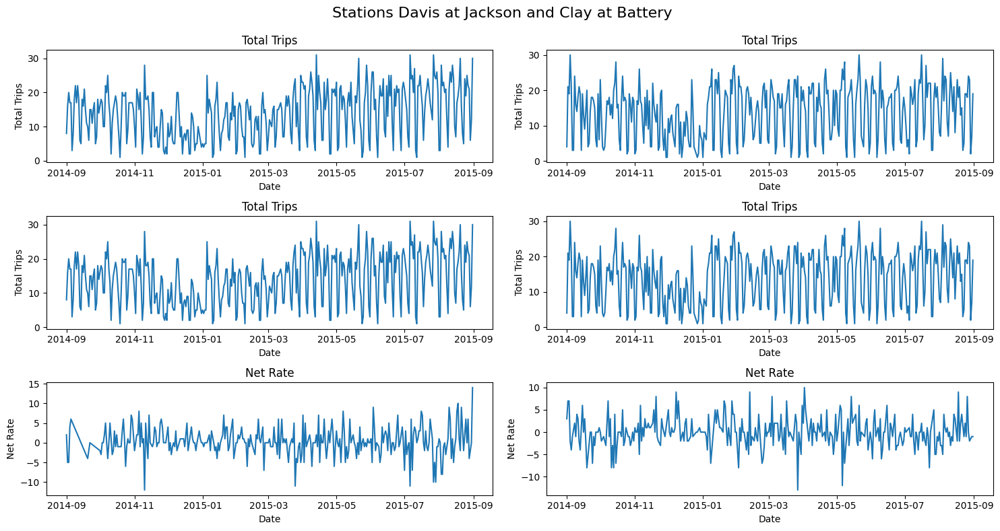

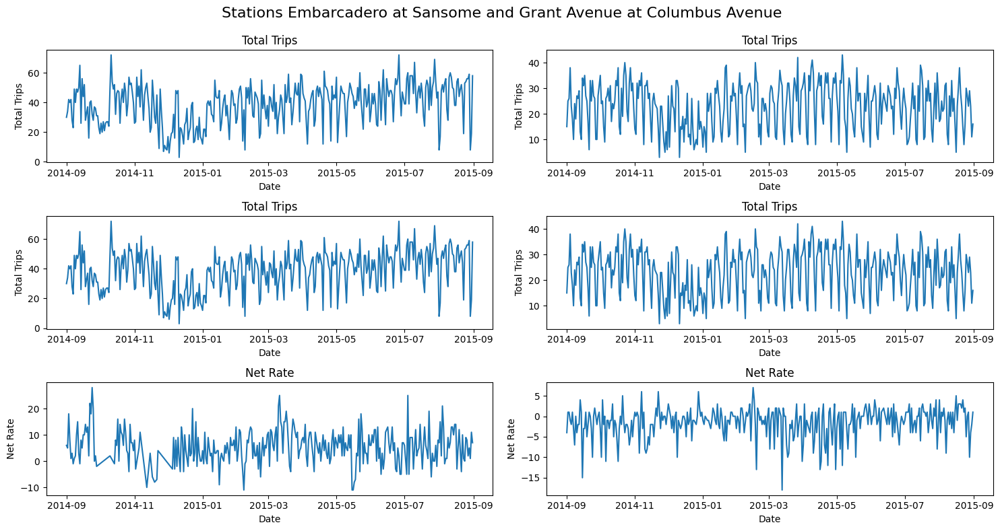

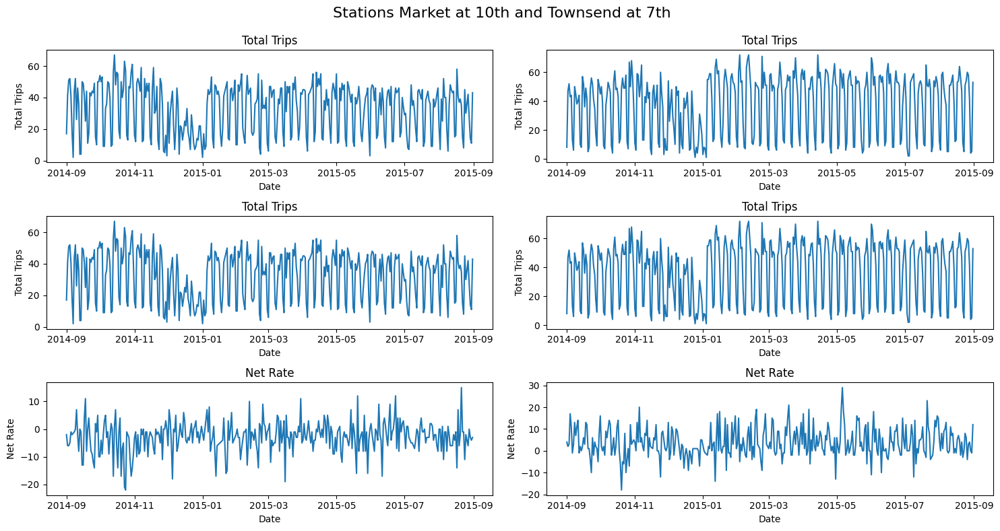

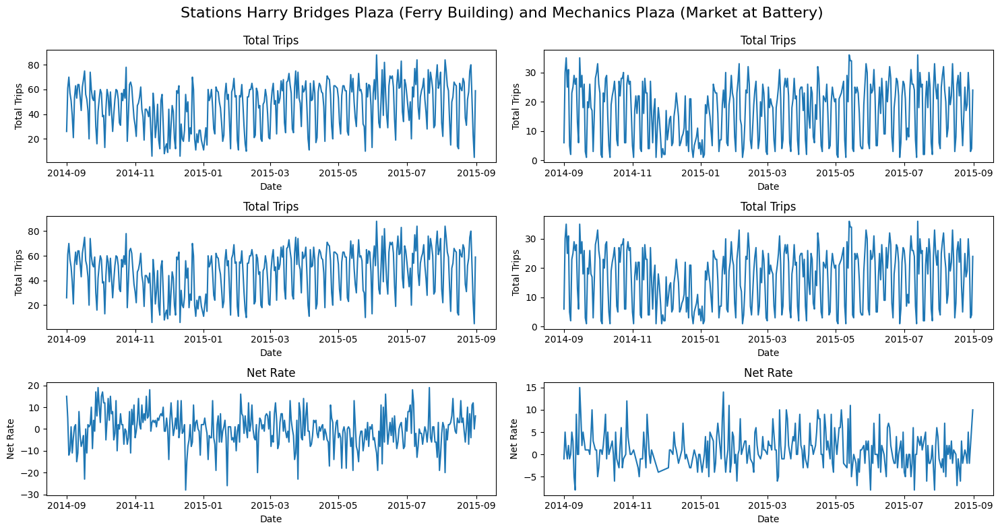

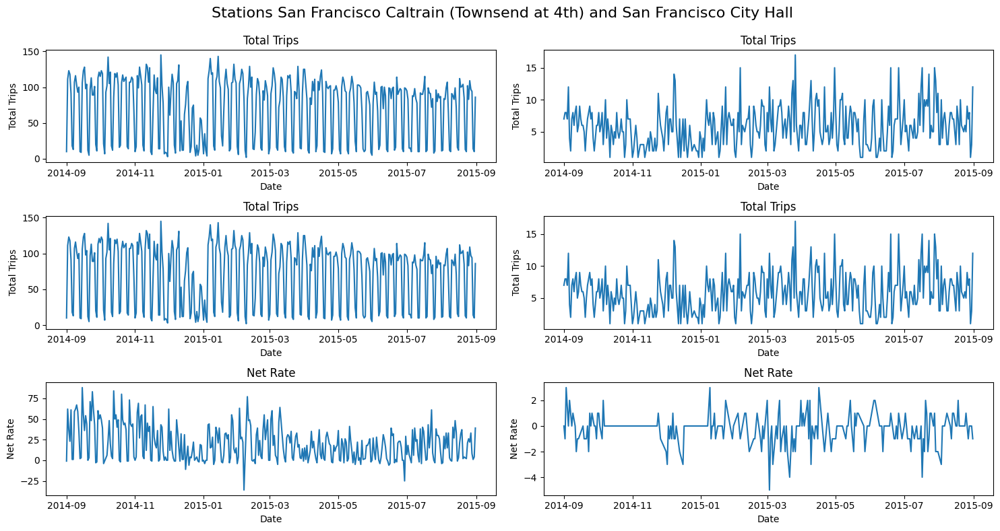

...

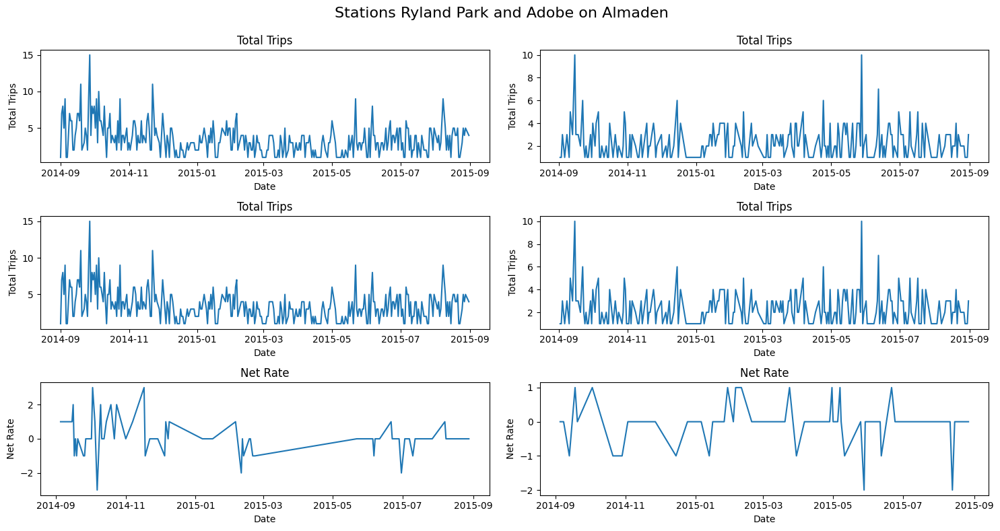

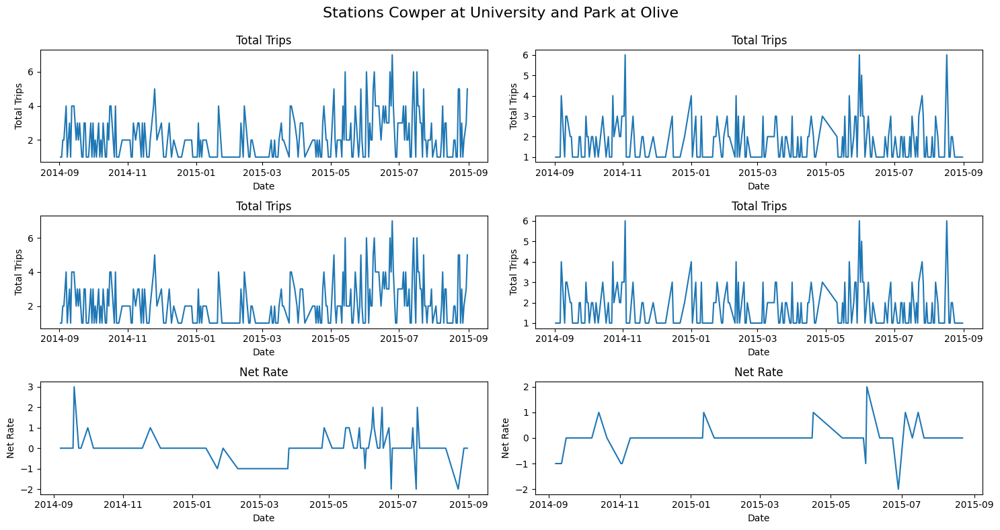

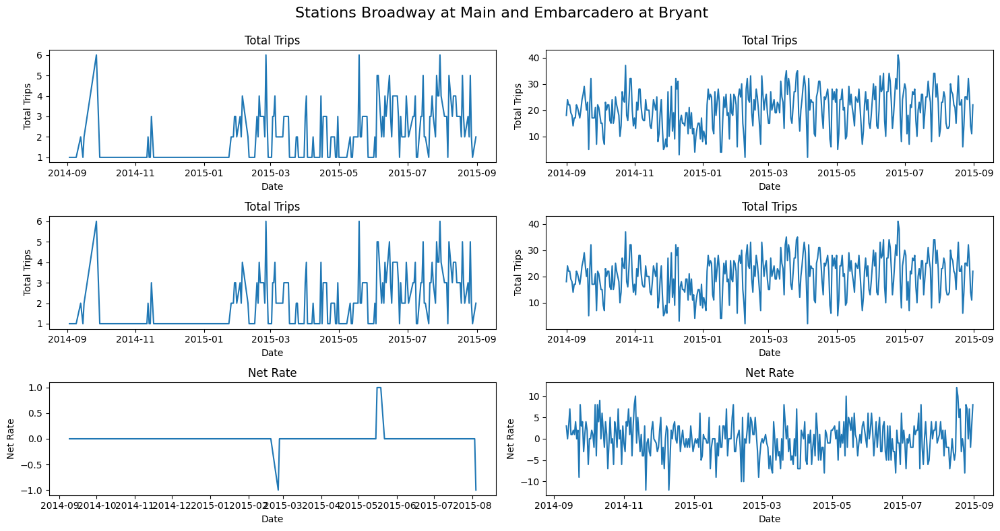

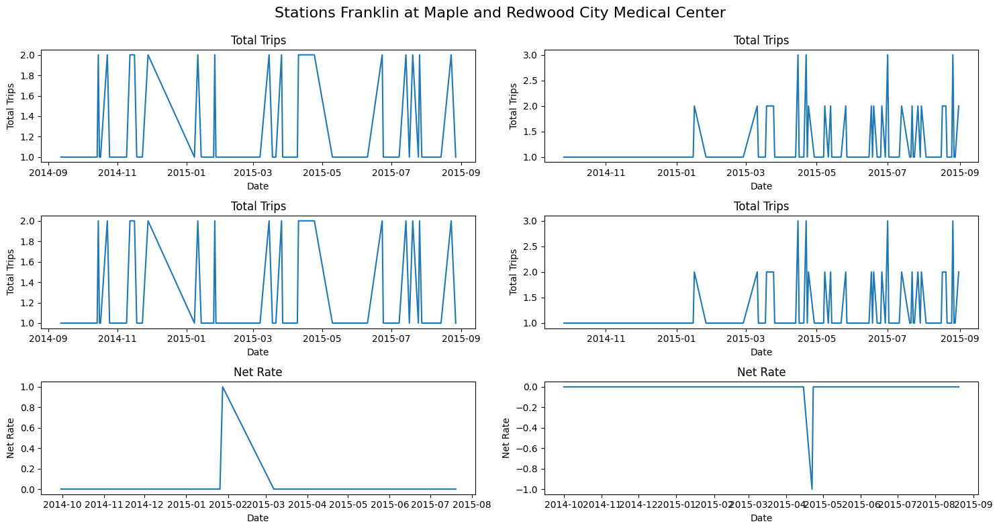

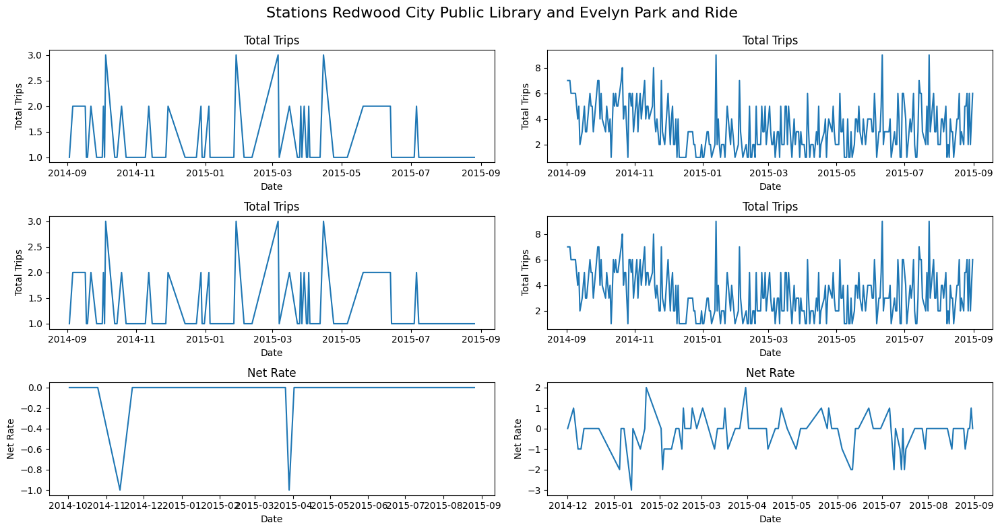

In [113]:
#Now we want to show the results in each station
#Listing each station
stationsnames = table_for_net_rate_per_day['Station Name'].unique()

#Assign the number of rows and column of each subplot
num_rows = 3  #For the 3 variables to plot
num_cols = 2  #For stations' quantity per plot

#Iterating through stations
for i in range(0, len(stationsnames), num_cols):
    station_group = stationsnames[i:i + num_cols]

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 8))
    fig.suptitle(f'Stations {station_group[0]} and {station_group[1]}', fontsize=16)

    # Rowing variables per plot
    for j, variable in enumerate(['Total Trips', 'Total Trips', 'Net Rate']):
        for k, station in enumerate(station_group):
            ax = axes[j, k]
            if variable == 'Total Trips':
                data = started_trips_per_station_per_day[started_trips_per_station_per_day['Start Station Name'] == station]
            elif variable == 'Total Trips':
                data = ended_trips_per_station_per_day[ended_trips_per_station_per_day['End Station Name'] == station]
            else:  # 'Net Rate'
                data = daily_net_rate_per_station[daily_net_rate_per_station['Station Name'] == station]

            ax.plot(data['Date'], data[variable], label=variable)
            ax.set_xlabel('Date')
            ax.set_ylabel(variable)
            ax.set_title(f'{variable}')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()




### End